# Libraries and Trained Model

In [17]:
from tensorflow.keras.models import load_model
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import random
from PIL import Image

model = load_model('Trained Model.h5')

# Load Testing Dataset

In [18]:
testing_dir = 'C:\\Users\\JoshyBoi\\WGU C964 Final Capstone\\Dataset\\Testing'

testing_paths = []
testing_labels = []

for label in os.listdir(testing_dir):
    creature_folder = os.path.join(testing_dir, label)
    for image in os.listdir(creature_folder):
        testing_paths.append(os.path.join(creature_folder, image))
        testing_labels.append(label)
        
testing_df = pd.DataFrame({'ImagePath': testing_paths, 'Label': testing_labels})


testing_dataset = ImageDataGenerator(rescale=1./255)
testing_images = testing_dataset.flow_from_directory(
    testing_dir,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False)


test_labels = testing_images.classes


predictions = model.predict(x=testing_images, verbose=0)


pred = np.argmax(predictions, axis=1)

Found 300 images belonging to 15 classes.


C:\Users\JoshyBoi\anaconda3\envs\sea_creature_model\lib\site-packages\PIL\Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


# Accuracy Bar Chart

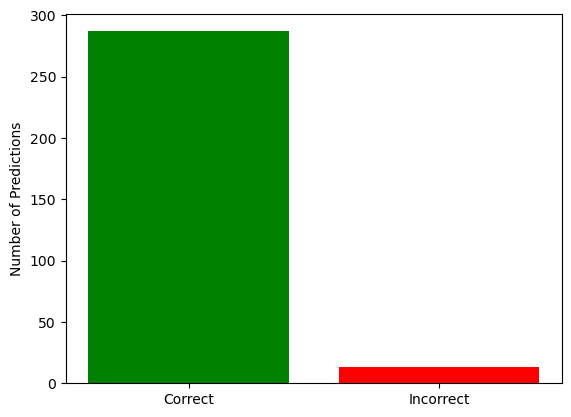

In [19]:
correct_predictions = np.sum(pred == test_labels)
incorrect_predictions = len(test_labels) - correct_predictions

labels = ['Correct', 'Incorrect']
counts = [correct_predictions, incorrect_predictions]

plt.bar(labels, counts, color=['green', 'red'])

plt.ylabel('Number of Predictions')
plt.show()

# Confusion Matrix

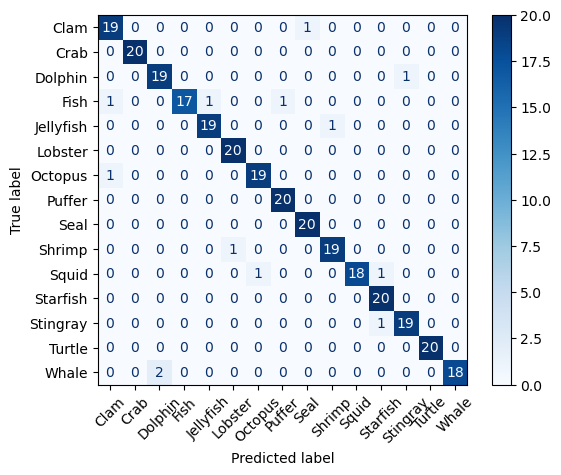

In [20]:
cmatrix = confusion_matrix(test_labels, pred)

labels = list(testing_images.class_indices.keys())
display = ConfusionMatrixDisplay(confusion_matrix = cmatrix, display_labels=labels)

display.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=45)
plt.show()

# Model Predictions
***Re-run this cell to let the model predict from a new random set of images***

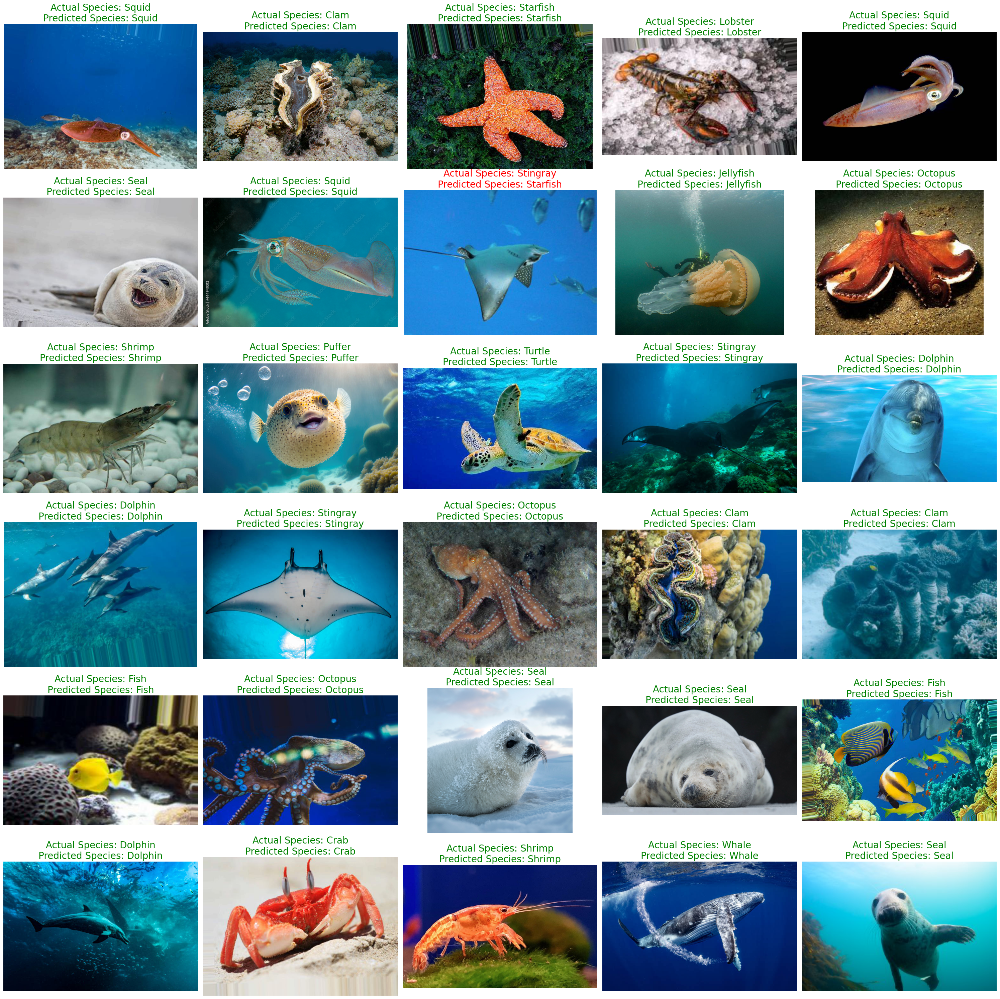

In [21]:
random_index = np.random.randint(0, len(testing_df), 30)
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 30))

for i, ax in enumerate(axes.flat):
    ax.imshow(Image.open(testing_df.ImagePath.iloc[random_index[i]]))  
    
    actual = testing_df.Label.iloc[random_index[i]]
    predicted = labels[pred[random_index[i]]]  

    color = "green" if actual == predicted else "red"
    ax.set_title(f"Actual Species: {actual}\nPredicted Species: {predicted}", color=color, fontsize=20)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Accuracy Level

In [23]:
loss, accuracy = model.evaluate(testing_images, verbose=1)
print(f"Test Accuracy: {accuracy*100:2f}%")

 7/10 [====================>.........] - ETA: 1s - loss: 0.1661 - accuracy: 0.9554

C:\Users\JoshyBoi\anaconda3\envs\sea_creature_model\lib\site-packages\PIL\Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


10/10 [==============================] - 4s 336ms/step - loss: 0.1672 - accuracy: 0.9567
Test Accuracy: 95.666665%
